# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc,roc_auc_score
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

"""from gensim.models import Word2Vec
from gensim.models import KeyedVectors"""
import pickle

from tqdm import tqdm
import os
from scipy.sparse import hstack
from sklearn.preprocessing import StandardScaler

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

## 1.1 Reading Data

In [2]:
import pandas as pd
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]

In [5]:
#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [6]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [7]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)

sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kc: kc[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [8]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [9]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [10]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...


In [11]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [12]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

### Limiting data poits to 40K due to system constrain

In [13]:
project_data = project_data.iloc[0:40000,:]
X=project_data.drop(columns=["project_is_approved"])
Y=project_data["project_is_approved"]
X["project_grade_category"].value_counts()

Grades PreK-2    16815
Grades 3-5       13658
Grades 6-8        5866
Grades 9-12       3661
Name: project_grade_category, dtype: int64

In [14]:
X["project_grade_category"][X["project_grade_category"]=="Grades PreK-2"]="GradeA"
X["project_grade_category"][X["project_grade_category"]=="Grades 3-5"]="GradeB"
X["project_grade_category"][X["project_grade_category"]=="Grades 6-8"]="GradeC"
X["project_grade_category"][X["project_grade_category"]=="Grades 9-12"]="GradeD"

In [15]:
X.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_grade_category', 'project_title', 'project_essay_1',
       'project_essay_2', 'project_essay_3', 'project_essay_4',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'clean_categories',
       'clean_subcategories', 'essay'],
      dtype='object')

## Preprocessing of `essay'

In [16]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(X['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 40000/40000 [00:26<00:00, 1490.87it/s]


In [17]:
X['essay']=preprocessed_essays

<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [18]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_project_title = []
# tqdm is for printing the status bar
for sentance in tqdm(X['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_project_title.append(sent.lower().strip())

100%|██████████| 40000/40000 [00:01<00:00, 33220.69it/s]


In [19]:
X['project_title']=preprocessed_project_title

## 1.5 Preparing data for models

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

# Task: Clustering

- <font color='red'>step 1</font>: Choose any vectorizer (data matrix) that you have worked in any of the Task, and got the best AUC value.
- <font color='red'>step 2</font>: Choose any of the <a href='https://scikit-learn.org/stable/modules/feature_selection.html'>feature selection</a>/<a href='https://scikit-learn.org/stable/modules/decomposition.html'>reduction algorithms</a> ex: selectkbest features, pretrained word vectors, model based feature selection etc and reduce the number of features to 5k features
- <font color='red'>step 3</font>: Apply all three kmeans, Agglomerative clustering, DBSCAN
    - <strong>K-Means Clustering:</strong> <br>
        ● Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)<br>
    - <strong>Agglomerative Clustering: </strong><br>
        ● Apply <a href='https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/'>agglomerative algorithm</a> and try a different number of clusters like 2,5 etc. <br>
        ● You can take less data points (as this is very computationally expensive one) to perform hierarchical clustering because they do take a considerable amount of time to run. <br>
    - <strong>DBSCAN Clustering: </strong><br>
        ● Find the best ‘eps’ using the <a href='https://stackoverflow.com/a/48558030/4084039'>elbow-knee method</a>.<br>
        ● You can take a smaller sample size for this as well.
- <font color='red'>step 4</font>: Summarize each cluster by manually observing few points from each cluster.
- <font color='red'>step 5</font>: You need to plot the word cloud with essay text for each cluster for each of algorithms mentioned in <font color='red'>step 3</font>.

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

<h1>2. Clustering </h1>

<h2>2.1 Choose the best data matrix on which you got the best AUC</h2>

In [20]:
# splitting data into train and test
from sklearn.cross_validation import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.20, random_state=42)

/usr/local/lib/python3.5/site-packages/sklearn/cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



In [21]:
for i in [X_train,X_test,Y_train,Y_test]:
    print(i.shape)

(32000, 17)
(8000, 17)
(32000,)
(8000,)


<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

#### encoding project_subject categorical

In [22]:
# we use count vectorizer to convert the values into one 
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=True, binary=True)
categories_one_hot_X_train = vectorizer.fit_transform(X_train['clean_categories'])
categories_one_hot_X_test = vectorizer.transform(X_test['clean_categories'])
print(vectorizer.get_feature_names())
print("categories_one_hot_X_train : {0} \ncategories_one_hot_X_test : {1} ".format(categories_one_hot_X_train.shape,categories_one_hot_X_test.shape))

['Health_Sports', 'Warmth', 'Literacy_Language', 'SpecialNeeds', 'History_Civics', 'Music_Arts', 'Math_Science', 'Care_Hunger', 'AppliedLearning']
categories_one_hot_X_train : (32000, 9) 
categories_one_hot_X_test : (8000, 9) 


#### Encoding project_subject  sub categorical

In [23]:
# we use count vectorizer to convert the values into one clean_subcategories
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
sub_categories_one_hot_X_train = vectorizer.fit_transform(X_train['clean_subcategories'].values)
sub_categories_one_hot_X_test = vectorizer.transform(X_test['clean_subcategories'].values)
print(vectorizer.get_feature_names())
print("sub_categories_one_hot_X_train : {0}\nsub_categories_one_hot_X_test : {1}".\
      format(sub_categories_one_hot_X_train.shape,sub_categories_one_hot_X_test.shape))

['Health_LifeScience', 'CharacterEducation', 'History_Geography', 'EarlyDevelopment', 'TeamSports', 'ForeignLanguages', 'Literacy', 'PerformingArts', 'Care_Hunger', 'Extracurricular', 'Other', 'Literature_Writing', 'AppliedSciences', 'SpecialNeeds', 'VisualArts', 'NutritionEducation', 'SocialSciences', 'Gym_Fitness', 'Health_Wellness', 'ESL', 'Mathematics', 'Music', 'Warmth', 'ParentInvolvement', 'Economics', 'Civics_Government', 'FinancialLiteracy', 'College_CareerPrep', 'CommunityService', 'EnvironmentalScience']
sub_categories_one_hot_X_train : (32000, 30)
sub_categories_one_hot_X_test : (8000, 30)


#### Encoding school_state categorical

In [24]:
# we use count vectorizer to convert the values into one school_state
vectorizer = CountVectorizer()
school_state_one_hot_X_train = vectorizer.fit_transform(X_train['school_state'].values)
school_state_one_hot_X_test = vectorizer.transform(X_test['school_state'].values)
print(vectorizer.get_feature_names())
print("school_state_one_hot_X_train : {}\nschool_state_one_hot_X_test : {}".\
      format(school_state_one_hot_X_train.shape,school_state_one_hot_X_test.shape))

['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']
school_state_one_hot_X_train : (32000, 51)
school_state_one_hot_X_test : (8000, 51)


#### Encoding teacher_prefix categorical

In [25]:
# we use count vectorizer to convert the values into one hot encoded features
#https://stackoverflow.com/questions/39303912/tfidfvectorizer-in-scikit-learn-valueerror-np-nan-is-an-invalid-document
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(lowercase=False, binary=True,encoding='utf-8')
vectorizer.fit(X_train['teacher_prefix'].values.astype('U'))
print(vectorizer.get_feature_names())


teacher_prefix_one_hot_X_train = vectorizer.transform(X_train['teacher_prefix'].values.astype('U'))
teacher_prefix_one_hot_X_test = vectorizer.transform(X_test['teacher_prefix'].values.astype('U'))

print("teacher_prefix_one_hot_X_train : {} \nteacher_prefix_one_hot_X_test : {}".\
      format(teacher_prefix_one_hot_X_train.shape,teacher_prefix_one_hot_X_test.shape))

['Dr', 'Mr', 'Mrs', 'Ms', 'Teacher', 'nan']
teacher_prefix_one_hot_X_train : (32000, 6) 
teacher_prefix_one_hot_X_test : (8000, 6)


#### Encoding project_grade_category categorical

In [26]:
# we use count vectorizer to convert the values into one project_grade_category
vectorizer = CountVectorizer(lowercase=False,)

grade_one_hot_X_train=vectorizer.fit_transform(X_train["project_grade_category"])
grade_one_hot_X_test=vectorizer.fit_transform(X_test["project_grade_category"])

vectorizer.get_feature_names()
print("grade_one_hot_X_train : {} \ngrade_one_hot_X_test : {}".\
      format(grade_one_hot_X_train.shape,grade_one_hot_X_test.shape))

grade_one_hot_X_train : (32000, 4) 
grade_one_hot_X_test : (8000, 4)


In [27]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
X_train = pd.merge(X_train, price_data, on='id', how='left')
X_test = pd.merge(X_test, price_data, on='id', how='left')

In [28]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

price_scalar = StandardScaler()
price_scalar.fit(X_train['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data

# Now standardize the data with above maen and variance.
price_standardized_X_train = price_scalar.transform(X_train['price'].values.reshape(-1, 1))
price_standardized_X_test = price_scalar.transform(X_test['price'].values.reshape(-1, 1))

In [29]:
Quantity_scalar = StandardScaler()
Quantity_scalar.fit(X_train['quantity'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
Quantity_X_train = Quantity_scalar.transform(X_train['quantity'].values.reshape(-1, 1))
Quantity_X_test = Quantity_scalar.transform(X_test['quantity'].values.reshape(-1, 1))

<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

#### Bag of words

In [30]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10,max_features=5000)
essay_bow_X_train = vectorizer.fit_transform(X_train["essay"])
essay_bow_X_test = vectorizer.transform(X_test["essay"])

print("essay_bow_X_train : {} \nessay_bow_X_test : {}".\
      format(essay_bow_X_train.shape,essay_bow_X_test.shape))

essay_bow_X_train : (32000, 5000) 
essay_bow_X_test : (8000, 5000)


In [31]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10,max_features=5000)
project_title_bow_X_train = vectorizer.fit_transform(X_train["project_title"])
project_title_bow_X_test = vectorizer.transform(X_test["project_title"])

print("project_title_bow_X_train : {} \nproject_title_bow_X_test : {}".\
      format(project_title_bow_X_train.shape,project_title_bow_X_test.shape))

project_title_bow_X_train : (32000, 1455) 
project_title_bow_X_test : (8000, 1455)


#### TFIDF vectorizer

In [32]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,max_features=5000)
essay_tfidf_X_train = vectorizer.fit_transform(X_train["essay"])
essay_tfidf_X_test = vectorizer.transform(X_test["essay"])

print("essay_tfidf_X_train : {} \nessay_tfidf_X_test : {}".\
      format(essay_tfidf_X_train.shape,essay_tfidf_X_test.shape))

essay_tfidf_X_train : (32000, 5000) 
essay_tfidf_X_test : (8000, 5000)


In [33]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,max_features=5000)
project_title_tfidf_X_train = vectorizer.fit_transform(X_train["project_title"])
project_title_tfidf_X_test = vectorizer.transform(X_test["project_title"])

print("project_title_tfidf_X_train : {} \nproject_title_tfidf_X_test : {}".\
      format(project_title_tfidf_X_train.shape,project_title_tfidf_X_test.shape))

project_title_tfidf_X_train : (32000, 1455) 
project_title_tfidf_X_test : (8000, 1455)


#### Using Pretrained Models: Avg W2V

In [34]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [35]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_essay_X_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in (X_train["essay"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_essay_X_train.append(vector)
print(len(avg_w2v_vectors_essay_X_train))
print(len(avg_w2v_vectors_essay_X_train[0]))

32000
300


In [36]:
own_corpus = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train["essay"]):
    for i in sentence.split(" "):
        if i not in own_corpus:
            own_corpus.append(i)

100%|██████████| 32000/32000 [01:37<00:00, 326.72it/s]


In [37]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_essay_X_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test["essay"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words and word in own_corpus:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_essay_X_test.append(vector)
print(len(avg_w2v_vectors_essay_X_test))
print(len(avg_w2v_vectors_essay_X_test[0]))

100%|██████████| 8000/8000 [00:33<00:00, 240.77it/s]

8000
300


In [38]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_project_title_X_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in (X_train["project_title"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_project_title_X_train.append(vector)
print(len(avg_w2v_vectors_project_title_X_train))
print(len(avg_w2v_vectors_project_title_X_train[0]))

32000
300


In [39]:
corpus_project_title=[]
for title in (X_train["project_title"]):
    for i in title.split(" "):
        if i not in corpus_project_title:
            corpus_project_title.append(i)

In [40]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_project_title_X_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in (X_test["project_title"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words and word in corpus_project_title:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_project_title_X_test.append(vector)
print(len(avg_w2v_vectors_project_title_X_test))
print(len(avg_w2v_vectors_project_title_X_test[0]))

8000
300


#### Using Pretrained Models: TFIDF weighted W2V¶

In [41]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train["essay"])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [42]:
# TFIDF Word2Vec on essay
# compute average word2vec for each review.
tfidf_w2v_vectors_essay_X_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in (X_train["essay"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_essay_X_train.append(vector)
print(len(tfidf_w2v_vectors_essay_X_train))
print(len(tfidf_w2v_vectors_essay_X_train[0]))

32000
300


In [43]:
# TFIDF Word2Vec on essay
# compute average word2vec for each review.
tfidf_w2v_vectors_essay_X_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in (X_test["essay"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_essay_X_test.append(vector)
print(len(tfidf_w2v_vectors_essay_X_test))
print(len(tfidf_w2v_vectors_essay_X_test[0]))

8000
300


In [44]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train["project_title"])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_model_project_title = set(tfidf_model.get_feature_names())

In [45]:
# TFIDF Word2Vec on project_title
# compute average word2vec for each review.
tfidf_w2v_vectors_project_title_X_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in (X_train["project_title"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_model_project_title):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_project_title_X_train.append(vector)
print(len(tfidf_w2v_vectors_project_title_X_train))
print(len(tfidf_w2v_vectors_project_title_X_train[0]))

32000
300


In [46]:
# TFIDF Word2Vec on project_title
# compute average word2vec for each review.
tfidf_w2v_vectors_project_title_X_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in (X_test["project_title"]): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_model_project_title):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_project_title_X_test.append(vector)
print(len(tfidf_w2v_vectors_project_title_X_test))
print(len(tfidf_w2v_vectors_project_title_X_test[0]))

8000
300


<h2>2.4 Appling  Decision Tree on different kind of featurization as mentioned in the instructions</h2>

<br>Apply  Decision Tree on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

In [47]:
categorical_numerical_features_X_train=[categories_one_hot_X_train,sub_categories_one_hot_X_train,school_state_one_hot_X_train,\
                                        teacher_prefix_one_hot_X_train,grade_one_hot_X_train,price_standardized_X_train,Quantity_X_train]
categorical_numerical_features_X_test=[categories_one_hot_X_test,sub_categories_one_hot_X_test,school_state_one_hot_X_test,\
                                        teacher_prefix_one_hot_X_test,grade_one_hot_X_test,price_standardized_X_test,Quantity_X_test]

In [48]:
categorical_numerical_features_X_train_stack= hstack(categorical_numerical_features_X_train)
categorical_numerical_features_X_test_stack=  hstack(categorical_numerical_features_X_test)

### 2.4.2 Applying Decision Trees on TFIDF,<font color='red'> SET 2</font>

In [49]:
Set2_train=hstack((categorical_numerical_features_X_train_stack,essay_tfidf_X_train,project_title_tfidf_X_train)).toarray()
Set2_test=hstack((categorical_numerical_features_X_test_stack,essay_tfidf_X_test,project_title_tfidf_X_test)).toarray()

In [50]:
best_fit_dept_Set2 = 10
best_fit_min_split_Set2 = 500

In [51]:
model2 = DecisionTreeClassifier(max_depth=best_fit_dept_Set2,min_samples_split=best_fit_min_split_Set2)
model2 = model2.fit(Set2_train,Y_train)

In [52]:
fpr_tr,tpr_tr,th_tr = roc_curve(y_true=Y_train,y_score=model2.predict_proba(Set2_train)[:,1])
auc_train = roc_auc_score(y_true=Y_train,y_score=model2.predict_proba(Set2_train)[:,1])
fpr_te,tpr_te,th_te = roc_curve(y_true=Y_test,y_score=model2.predict_proba(Set2_test)[:,1])
auc_test = roc_auc_score(y_true=Y_test,y_score=model2.predict_proba(Set2_test)[:,1])

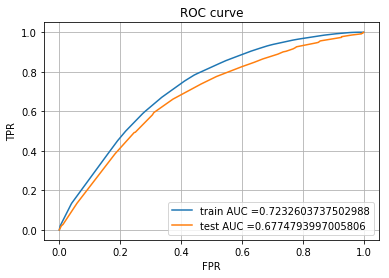

In [53]:
plt.plot(fpr_tr, tpr_tr, label="train AUC ="+str(auc_train))
plt.plot(fpr_te, tpr_te, label="test AUC ="+str(auc_test))

plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC curve")
plt.grid()
plt.show()

In [54]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(tpr*(1-fpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

the maximum value of tpr*(1-fpr) 0.41452476295962704 for threshold 0.877


Text(0.5, 1.0, 'Confusion matrix for Test data')

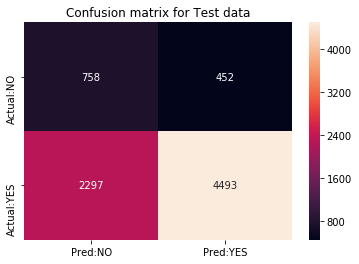

In [55]:
from seaborn import heatmap
heatmap((confusion_matrix(Y_test, predict(model2.predict_proba(Set2_test)[:,1], th_te, fpr_te, tpr_te))),annot=True, fmt="d",xticklabels=["Pred:NO","Pred:YES"],yticklabels=["Actual:NO","Actual:YES"])
plt.title("Confusion matrix for Test data")

In [56]:
best_5000_index = np.argsort(model2.feature_importances_)[::-1][:5000]

<h2>2.4 Dimensionality Reduction on the selected features </h2>

In [71]:
"""data = np.vstack((Set2_train[:,best_5000_index],Set2_test[:,best_5000_index]))
data.shape"""

(40000, 5000)

In [22]:
"""pd.DataFrame(data).to_csv(r"clust.csv")"""
data = pd.read_csv(r"clust.csv")
data = data.iloc[:,1:]

<h2>2.5 Apply Kmeans</h2>

In [23]:
from sklearn.cluster import KMeans

In [24]:
inertia_ls = []
for i in range(2,21,2):
    KM = KMeans(n_clusters = i,init='k-means++',n_jobs=-1)
    x_kmeans = KM.fit(data)
    inertia_ls.append(x_kmeans.inertia_)

Text(0.5, 1.0, 'k vs inertia_')

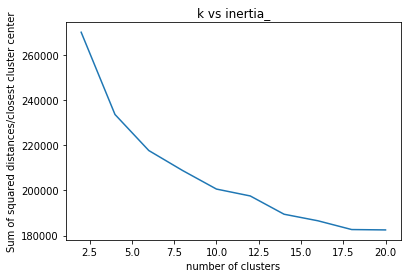

In [25]:
plt.plot((range(2,21,2)),inertia_ls)
plt.xlabel("number of clusters")
plt.ylabel("Sum of squared distances/closest cluster center")
plt.title( "k vs inertia_")

##### From the above plot it is seen that the "Sum of squared distances of samples to their closest cluster center " decreasses drastically till 14 and decreases mildly after that .so will consider 14 as our optimal cluster

In [24]:
KM = KMeans(n_clusters = 14,init='k-means++',n_jobs=-1)
result = KM.fit_predict(data)

In [25]:
def rand_select(cluster):
    index_of_cluster = np.where(result==cluster)[0] #gives index of the points of the given cluster
    rand = np.random.randint(0,index_of_cluster.shape[0],20) 
    subset_index_of_cluster = index_of_cluster[rand] #randomly select 50 points from the cluster
    return subset_index_of_cluster

##### choosing 20 points from each cluster and when number of positive points in that cluster is graeter than number of negative points we label it as positive cluster

In [26]:
for i in range(0,14):
    reviews_of_cluster = Y.iloc[rand_select(i)]
    print("reviews_of_cluster "+str(i)+":",reviews_of_cluster.value_counts(),sep='\n')
    if (reviews_of_cluster.value_counts()[0]>reviews_of_cluster.value_counts()[1]):
        print("As lot of random points from this cluster",i,"is from Negative class we label this cluster as Negative")
    else:
        print("As lot of random points from this cluster",i,"is from Positive class we label this cluster as Positive")
    print("*"*50)

reviews_of_cluster 0:
1    18
0     2
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 0 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 1:
1    15
0     5
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 1 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 2:
1    18
0     2
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 2 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 3:
1    18
0     2
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 3 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 4:
1    15
0     5
Name: project_is_approved, dtype: int64
As

##### word cloud

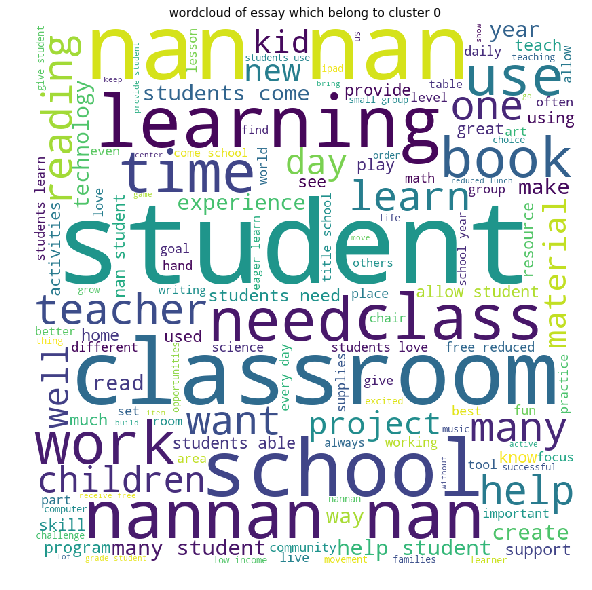

**************************************************


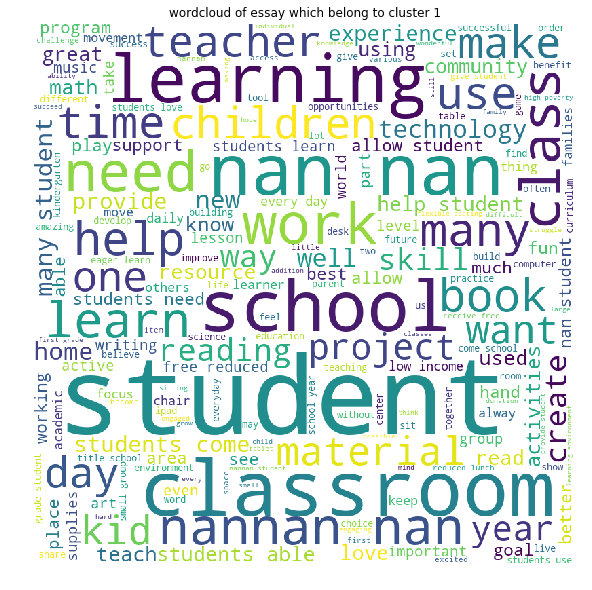

**************************************************


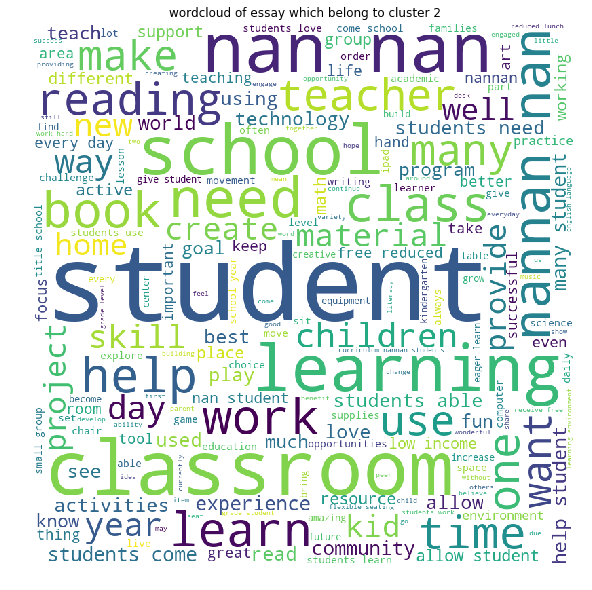

**************************************************


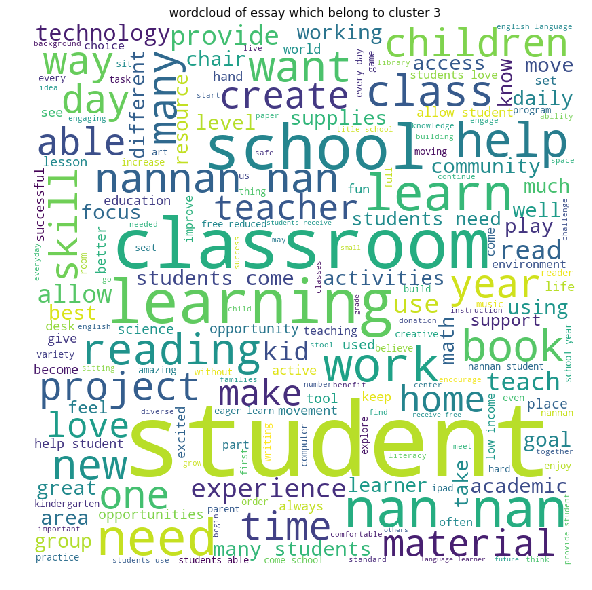

**************************************************


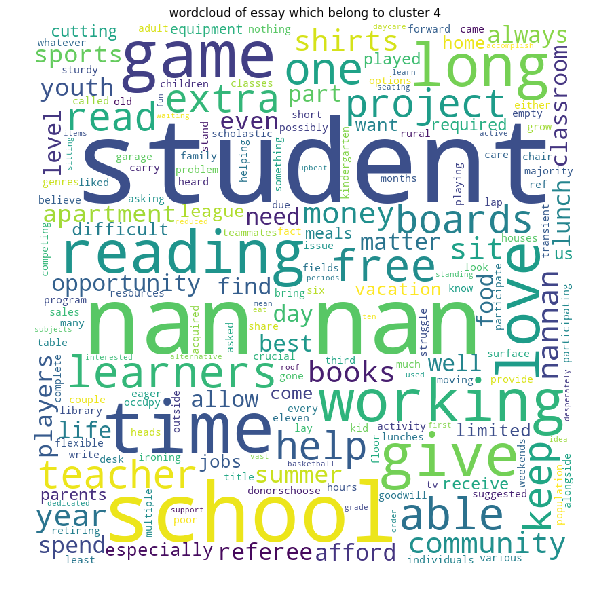

**************************************************


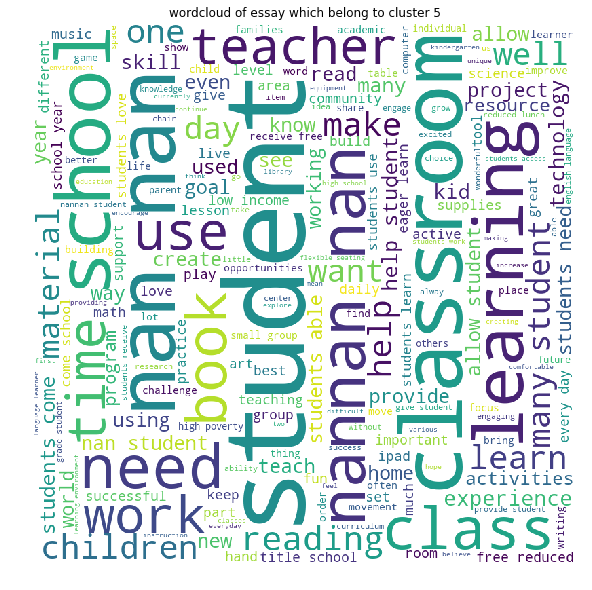

**************************************************


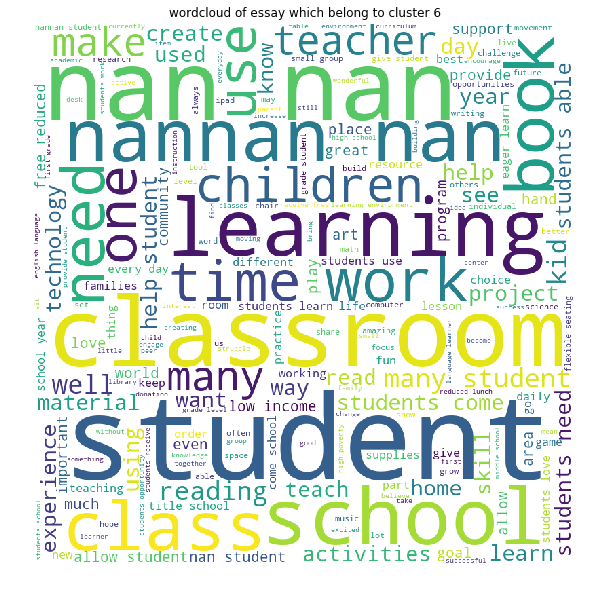

**************************************************


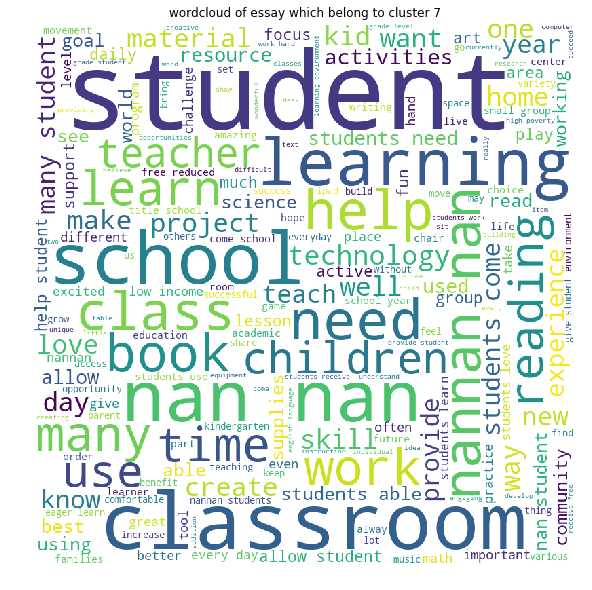

**************************************************


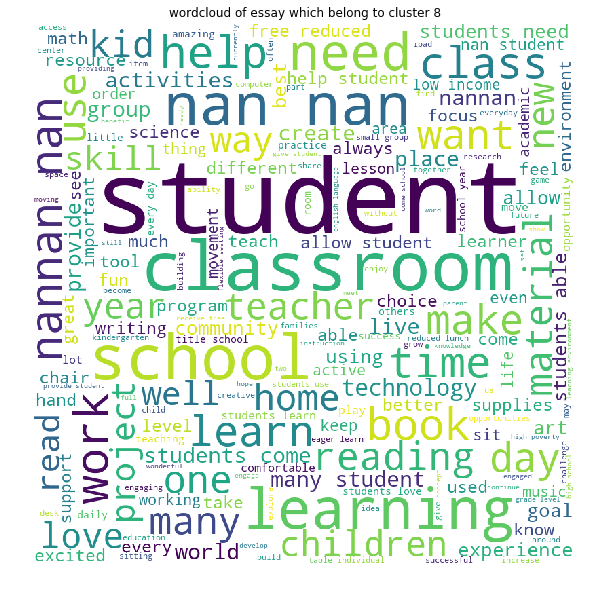

**************************************************


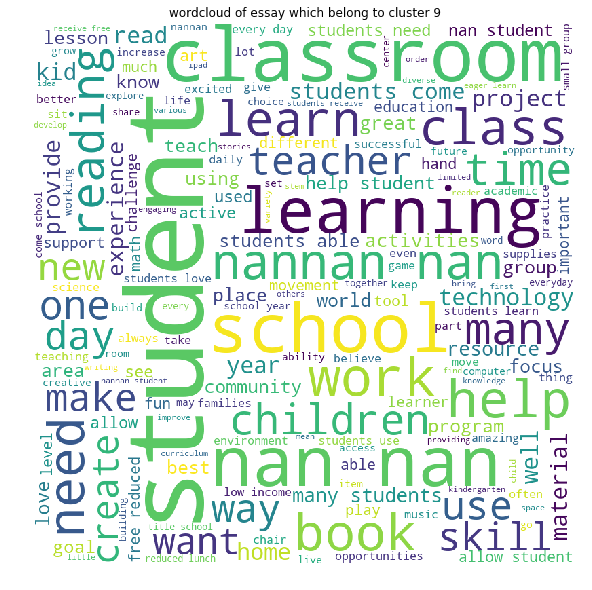

**************************************************


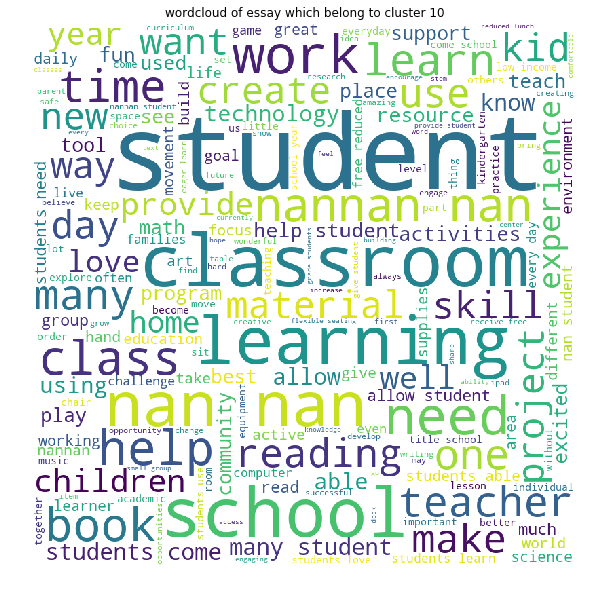

**************************************************


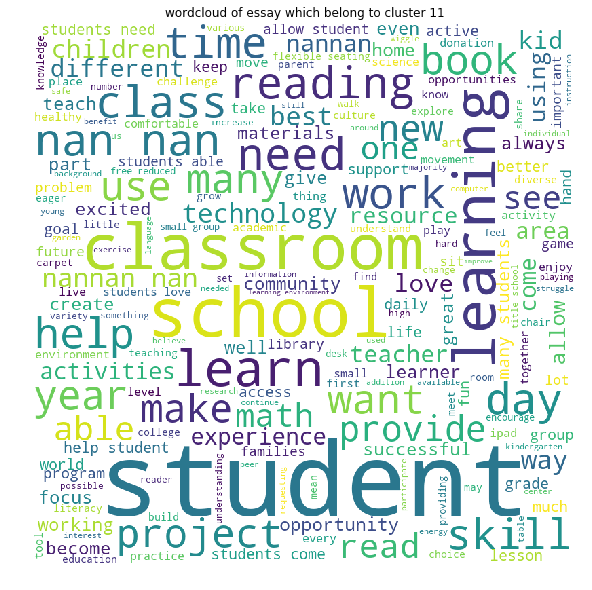

**************************************************


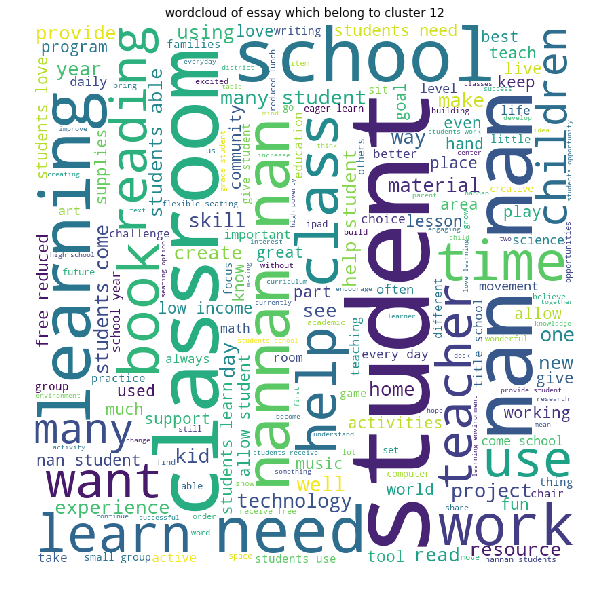

**************************************************


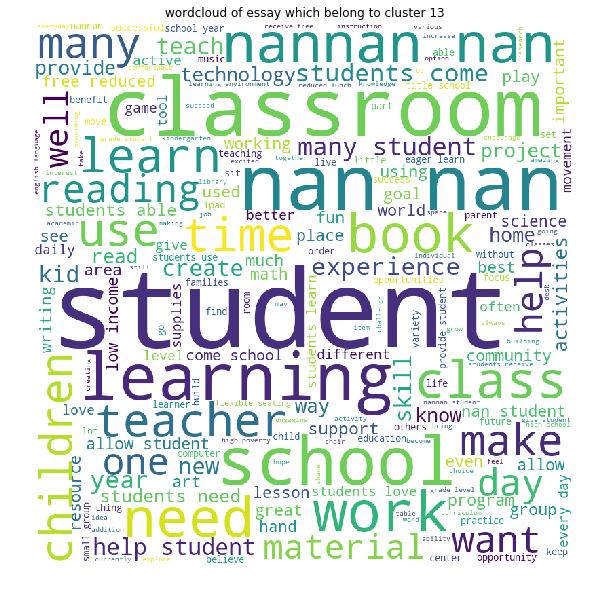

**************************************************


In [27]:
for cluster in range (0,14):
    FP_essay = X['essay'][np.where(result==cluster)[0]]
    from wordcloud import WordCloud, STOPWORDS 
  
    comment_words = ' '
    stopwords = set(STOPWORDS)
    
    
    # iterate through the csv file 
    for val in FP_essay: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.title("wordcloud of essay which belong to cluster "+str(cluster))
    plt.tight_layout(pad = 0) 
    plt.show()
    print("*"*50)

In [2]:
#list of most frequent word in each cluster is reacorded below
cluster_0 = ["Student","Classroom","School","Learning","Time"]
cluster_1 = ["Student","Classroom","School","Learning","Teacher"]
cluster_2 = ["Student","Classroom","School","Learning","Reading"]
cluster_3 = ["Student","Classroom","School","Need","Material"]
cluster_4 = ["Student","Reading","School","Game","Working"]
cluster_5 = ["Student","Classroom","Learning","School","Teacher"]
cluster_6 = ["Student","Classroom","Learning","School","Class"]
cluster_7 = ["Student","Classroom","Learning","School","Teacher"]
cluster_8 = ["Student","Classroom","Learning","School","Need"]
cluster_9 = ["Student","Classroom","Learning","School","Children"]
cluster_10 = ["Student","Classroom","Learning","School","Work"]
cluster_11 = ["Student","Classroom","Learning","School","Learn"]
cluster_12 = ["Student","Classroom","Learning","School","Book"]
cluster_13 = ["Student","Classroom","Learning","School","Work"]

In [3]:
ls = [cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,cluster_11,cluster_12,cluster_13]

### Mostly all the cluster are formed with most common words like Student,Classroom,Learning,School

In [4]:
j=0
for i in ls:
    print("most frequent word in cluster_"+str(j)+ ":",i)
    j = j+1

most frequent word in cluster_0: ['Student', 'Classroom', 'School', 'Learning', 'Time']
most frequent word in cluster_1: ['Student', 'Classroom', 'School', 'Learning', 'Teacher']
most frequent word in cluster_2: ['Student', 'Classroom', 'School', 'Learning', 'Reading']
most frequent word in cluster_3: ['Student', 'Classroom', 'School', 'Need', 'Material']
most frequent word in cluster_4: ['Student', 'Reading', 'School', 'Game', 'Working']
most frequent word in cluster_5: ['Student', 'Classroom', 'Learning', 'School', 'Teacher']
most frequent word in cluster_6: ['Student', 'Classroom', 'Learning', 'School', 'Class']
most frequent word in cluster_7: ['Student', 'Classroom', 'Learning', 'School', 'Teacher']
most frequent word in cluster_8: ['Student', 'Classroom', 'Learning', 'School', 'Need']
most frequent word in cluster_9: ['Student', 'Classroom', 'Learning', 'School', 'Children']
most frequent word in cluster_10: ['Student', 'Classroom', 'Learning', 'School', 'Work']
most frequent wor

<h2>2.6 Apply AgglomerativeClustering</h2>

In [28]:
data = pd.read_csv(r"clust.csv")
data_Agglomerative = data.iloc[:15000,1:]
data_Agglomerative.shape

(15000, 5000)

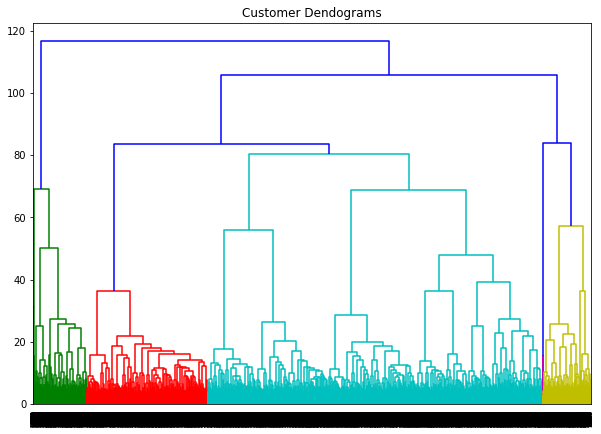

In [29]:
#https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))
plt.title("Customer Dendograms")
dend = shc.dendrogram(shc.linkage(data_Agglomerative, method='ward'))

In [30]:
def rand_select(cluster):
    index_of_cluster = np.where(results==cluster)[0] #gives index of the points of the given cluster
    if (index_of_cluster.shape[0]>=20):
        rand = np.random.randint(0,index_of_cluster.shape[0],20) 
        subset_index_of_cluster = index_of_cluster[rand] #randomly select 20 points from the cluster
    else:
        subset_index_of_cluster = index_of_cluster
    return subset_index_of_cluster

##### From above Dendograms we can see that the longest vertical when seperated by a horizontal line ,gives 3 intersection .which means 3 clusters can be formed

In [31]:
from sklearn.cluster import AgglomerativeClustering
clus = AgglomerativeClustering(n_clusters=3,affinity="euclidean",linkage='ward')
results = clus.fit_predict(data_Agglomerative)

In [32]:
for i in range(0,3):
    reviews_of_cluster = Y.iloc[rand_select(i)]
    print("reviews_of_cluster "+str(i)+":",reviews_of_cluster.value_counts(),sep='\n')
    if (reviews_of_cluster.value_counts()[0]>reviews_of_cluster.value_counts()[1]):
        print("As lot of random points from this cluster",i,"is from Negative class we label this cluster as Negative")
    else:
        print("As lot of random points from this cluster",i,"is from Positive class we label this cluster as Positive")
    print("*"*50)

reviews_of_cluster 0:
1    15
0     5
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 0 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 1:
1    18
0     2
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 1 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 2:
1    18
0     2
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 2 is from Positive class we label this cluster as Positive
**************************************************


##### Word cloud

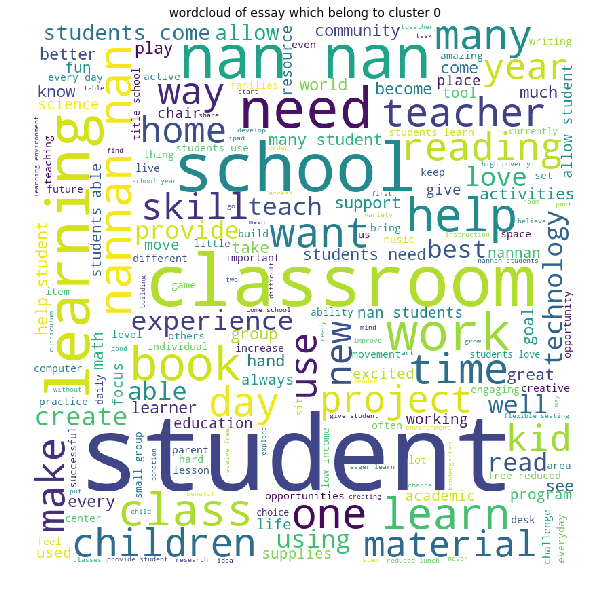

**************************************************


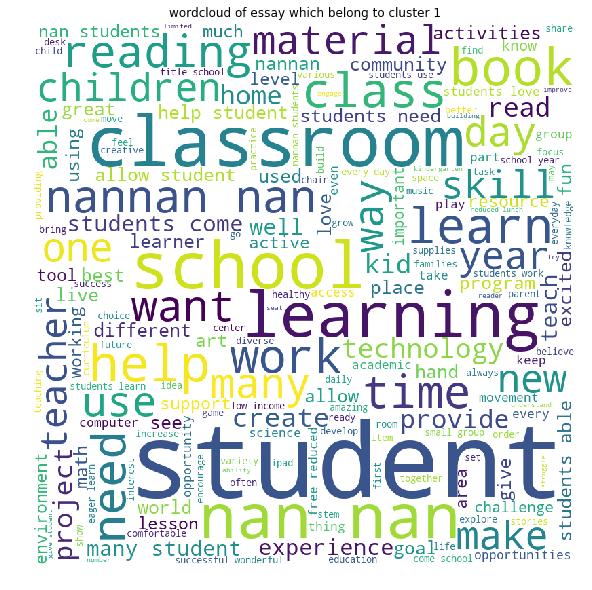

**************************************************


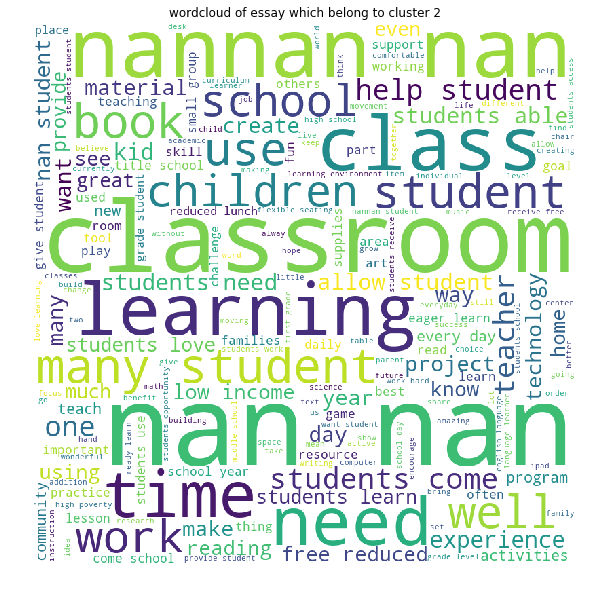

**************************************************


In [34]:
for cluster in range (0,3):
    FP_essay = X['essay'][np.where(results==cluster)[0]]
    from wordcloud import WordCloud, STOPWORDS 
  
    comment_words = ' '
    stopwords = set(STOPWORDS)
    
    
    # iterate through the csv file 
    for val in FP_essay: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.title("wordcloud of essay which belong to cluster "+str(cluster))
    plt.tight_layout(pad = 0) 
    plt.show()
    print("*"*50)

In [5]:
#list of most frequent word in each cluster is reacorded below
cluster_0 = ["Student","Classroom","School","Need","Learning",""]
cluster_1 = ["Student","Classroom","School","Learning","Book"]
cluster_2 = ["Classroom","Learning","Class","Time","Need"]

### Mostly all the cluster are formed with most common words like Student,Classroom,School,Learning

In [6]:
ls = [cluster_0,cluster_1,cluster_2]
j=0
for i in ls:
    print("most frequent word in cluster_"+str(j)+ ":",i)
    j = j+1

most frequent word in cluster_0: ['Student', 'Classroom', 'School', 'Need', 'Learning', '']
most frequent word in cluster_1: ['Student', 'Classroom', 'School', 'Learning', 'Book']
most frequent word in cluster_2: ['Classroom', 'Learning', 'Class', 'Time', 'Need']


##### From above Dendograms we can see that the next longest vertical when seperated by a horizontal line ,gives 8 intersection .which means 8 clusters can be formed

In [35]:
clus = AgglomerativeClustering(n_clusters=8,affinity="euclidean",linkage='ward')
results = clus.fit_predict(data_Agglomerative)

In [36]:
for i in range(0,8):
    reviews_of_cluster = Y.iloc[rand_select(i)]
    print("reviews_of_cluster "+str(i)+":",reviews_of_cluster.value_counts(),sep='\n')
    if (reviews_of_cluster.value_counts()[0]>reviews_of_cluster.value_counts()[1]):
        print("As lot of random points from this cluster",i,"is from Negative class we label this cluster as Negative")
    else:
        print("As lot of random points from this cluster",i,"is from Positive class we label this cluster as Positive")
    print("*"*50)

reviews_of_cluster 0:
1    17
0     3
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 0 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 1:
1    18
0     2
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 1 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 2:
1    16
0     4
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 2 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 3:
1    17
0     3
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 3 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster 4:
1    15
0     5
Name: project_is_approved, dtype: int64
As

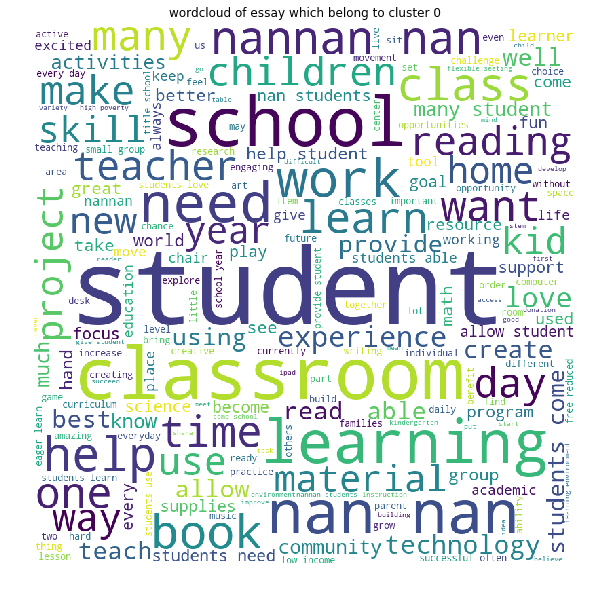

**************************************************


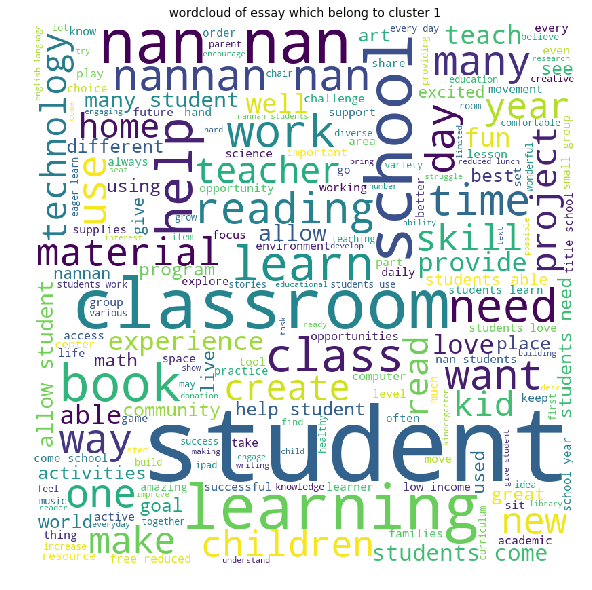

**************************************************


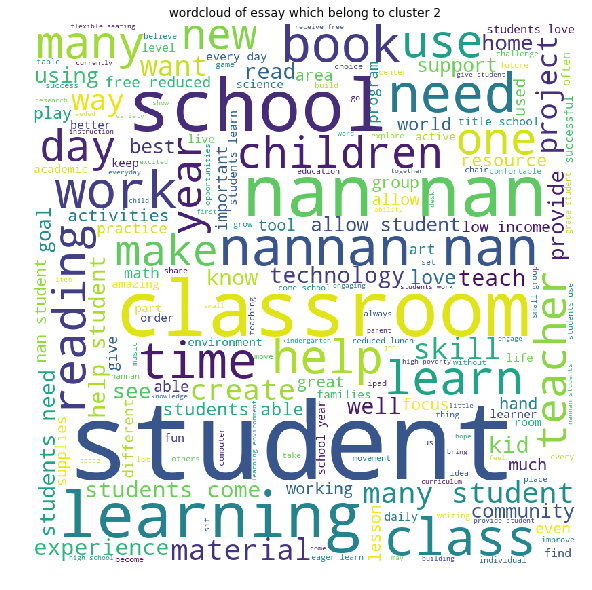

**************************************************


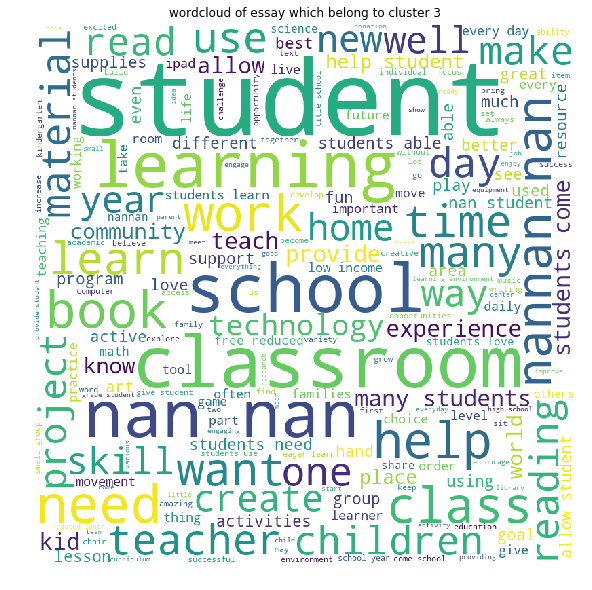

**************************************************


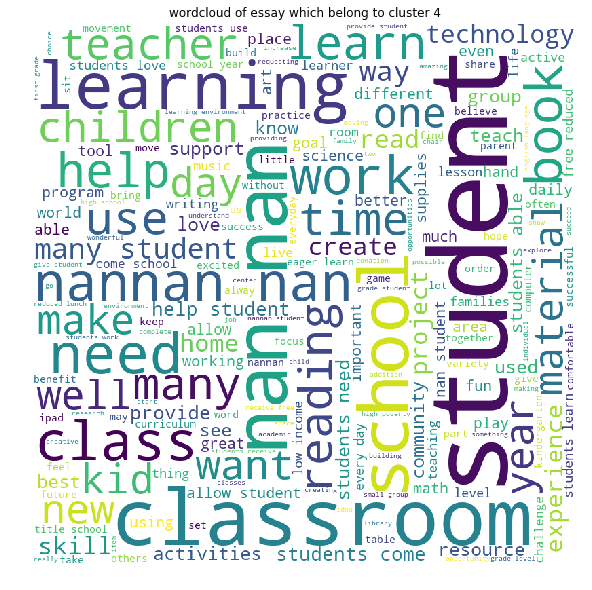

**************************************************


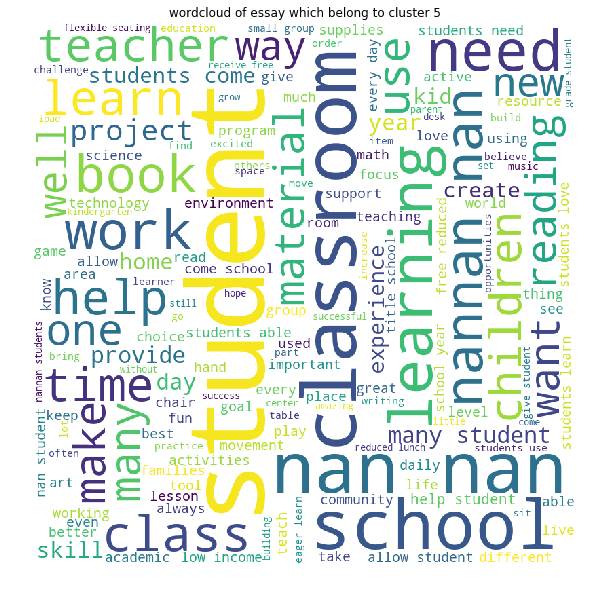

**************************************************


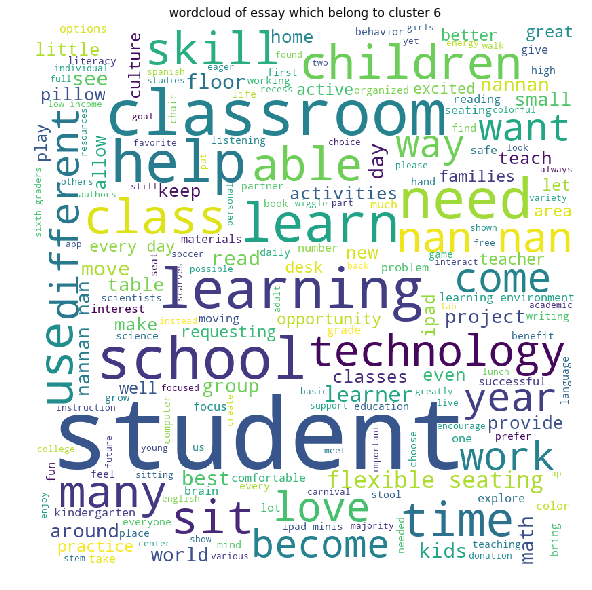

**************************************************


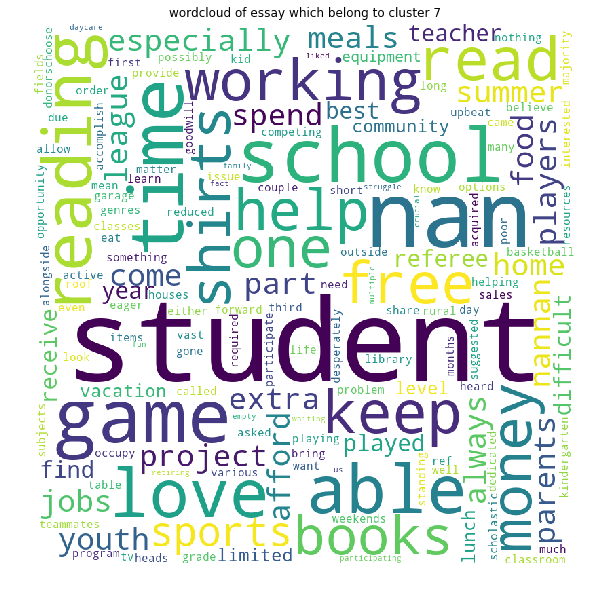

**************************************************


In [37]:
for cluster in range (0,8):
    FP_essay = X['essay'][np.where(results==cluster)[0]]
    from wordcloud import WordCloud, STOPWORDS 
  
    comment_words = ' '
    stopwords = set(STOPWORDS)
    
    
    # iterate through the csv file 
    for val in FP_essay: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.title("wordcloud of essay which belong to cluster "+str(cluster))
    plt.tight_layout(pad = 0) 
    plt.show()
    print("*"*50)

In [7]:
#list of most frequent word in each cluster is reacorded below
cluster_0 = ["Student","Classroom","School","Learning","Children"]
cluster_1 = ["Student","Classroom","School","Learning","Material"]
cluster_2 = ["Student","Classroom","School","Learning","Reading"]
cluster_3 = ["Student","Classroom","School","Learning","Book"]
cluster_4 = ["Student","Classroom","School","Learning","Work"]
cluster_5 = ["Student","Classroom","Learning","School","Children"]
cluster_6 = ["Student","Classroom","Learning","School","Help"]
cluster_7 = ["Student","Game","Love","Shirt","Books"]

### Here we can see that cluster 7 is formed of totally different words 'Student,Game,Love,Shirt,Books'

In [8]:
ls = [cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7]
j=0
for i in ls:
    print("most frequent word in cluster_"+str(j)+ ":",i)
    j = j+1

most frequent word in cluster_0: ['Student', 'Classroom', 'School', 'Learning', 'Children']
most frequent word in cluster_1: ['Student', 'Classroom', 'School', 'Learning', 'Material']
most frequent word in cluster_2: ['Student', 'Classroom', 'School', 'Learning', 'Reading']
most frequent word in cluster_3: ['Student', 'Classroom', 'School', 'Learning', 'Book']
most frequent word in cluster_4: ['Student', 'Classroom', 'School', 'Learning', 'Work']
most frequent word in cluster_5: ['Student', 'Classroom', 'Learning', 'School', 'Children']
most frequent word in cluster_6: ['Student', 'Classroom', 'Learning', 'School', 'Help']
most frequent word in cluster_7: ['Student', 'Game', 'Love', 'Shirt', 'Books']


<h2>2.7 Apply DBSCAN</h2>

In [21]:
data = pd.read_csv(r"clust.csv")
data_dbscan = data.iloc[:20000,1:]
data_dbscan.shape

(20000, 5000)

In [22]:
#select min points using rule of thumb(2*dimension od data) as we are gng to create model on subset of our data (20k points) we will keep min_points as 5000
min_samples = 5000*2

In [23]:
import math
def euclideanDistance(instance1, instance2, length):
    distance = 0
    for x in range(length):
        distance = distance + pow((instance1[x] - instance2[x]), 2)
        return math.sqrt(distance)

In [24]:
#find the Kth distsnce for every point in data set
kth_distance = []
for i in np.array(data_dbscan):
    dis=[]
    for j in np.array(data_dbscan):
        dis.append(euclideanDistance(i,j,i.shape[0]-1))
    dis.sort() 
    kth_distance.append(dis[5000])

Text(0.5, 1.0, 'Elbow curve')

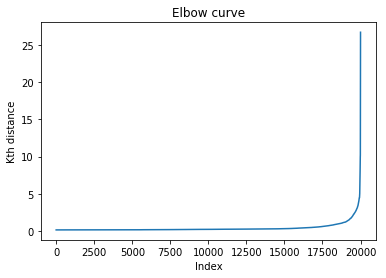

In [26]:
plt.plot(range(0,20000),sorted(kth_distance))
plt.xlabel("Index")
plt.ylabel("Kth distance")
plt.title( "Elbow curve")

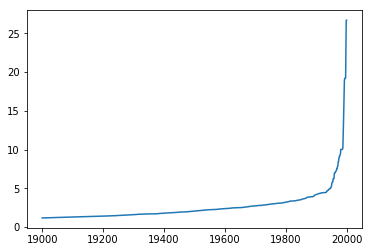

In [37]:
#zoomed view what happens at the range of 19000,20000
plt.plot(range(19000,20000),sorted(kth_distance)[19000:])

In [39]:
#from above graph its clear that the the curve changes drastically from 19800,so will check its Kth distance and take it as Eps
eps = sorted(kth_distance)[19800]
eps

3.2346256830447215

In [22]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps = 3.2346256830447215,min_samples = 5000*2)
result = dbscan.fit_predict(data_dbscan)

In [23]:
np.unique(result,return_counts=True)

(array([-1,  0]), array([ 1025, 18975]))

#### -1 represents noise points,0 represent one cluster 

In [24]:
def rand_select(cluster):
    index_of_cluster = np.where(result==cluster)[0] #gives index of the points of the given cluster
    if (index_of_cluster.shape[0]>=20):
        rand = np.random.randint(0,index_of_cluster.shape[0],20) 
        subset_index_of_cluster = index_of_cluster[rand] #randomly select 20 points from the cluster
    else:
        subset_index_of_cluster = index_of_cluster
    return subset_index_of_cluster

In [25]:
for i in (0,-1):
    reviews_of_cluster = Y.iloc[rand_select(i)]
    print("reviews_of_cluster "+str(i)+":",reviews_of_cluster.value_counts(),sep='\n')
    if (reviews_of_cluster.value_counts()[0]>reviews_of_cluster.value_counts()[1]):
        print("As lot of random points from this cluster",i,"is from Negative class we label this cluster as Negative")
    else:
        print("As lot of random points from this cluster",i,"is from Positive class we label this cluster as Positive")
    print("*"*50)

reviews_of_cluster 0:
1    14
0     6
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 0 is from Positive class we label this cluster as Positive
**************************************************
reviews_of_cluster -1:
1    19
0     1
Name: project_is_approved, dtype: int64
As lot of random points from this cluster -1 is from Positive class we label this cluster as Positive
**************************************************


###### All hav been classified to single cluster

In [32]:
reviews_of_cluster = Y.iloc[rand_select(0)]
print("reviews_of_cluster "+str(i)+":",reviews_of_cluster.value_counts(),sep='\n')
if (reviews_of_cluster.value_counts()[0]>reviews_of_cluster.value_counts()[1]):
    print("As lot of random points from this cluster",i,"is from Negative class we label this cluster as Negative")
else:
    print("As lot of random points from this cluster",i,"is from Positive class we label this cluster as Positive")

reviews_of_cluster 0:
1    19
0     1
Name: project_is_approved, dtype: int64
As lot of random points from this cluster 0 is from Positive class we label this cluster as Positive


###### Word cloud of  class 0 and noise points

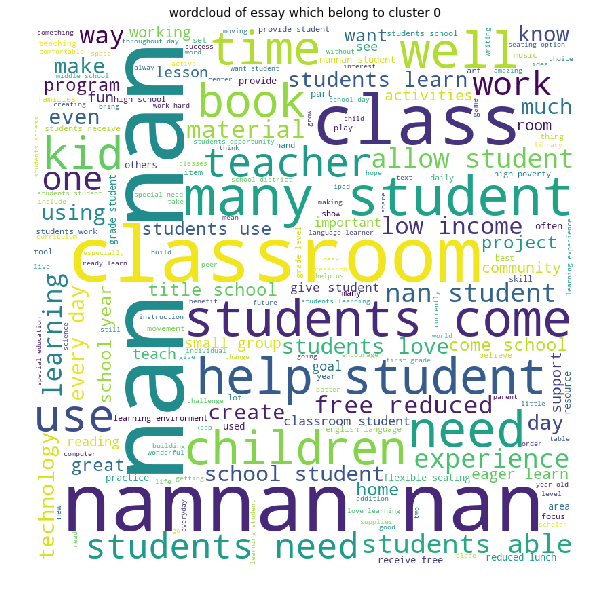

**************************************************


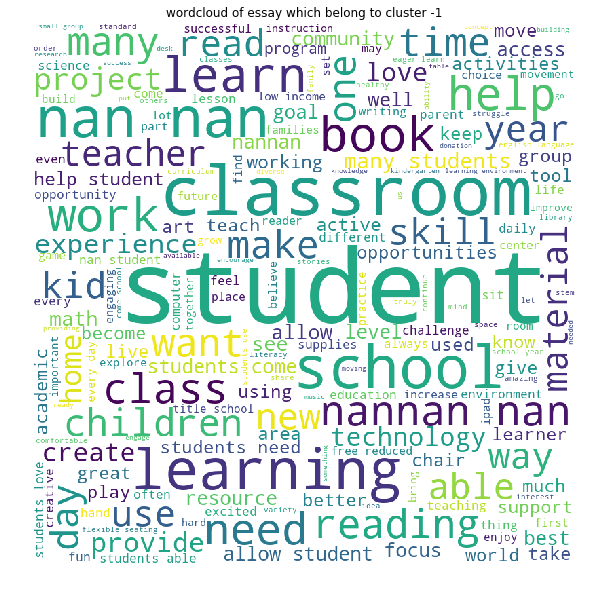

**************************************************


In [35]:
for cluster in (0,-1):
    FP_essay = X['essay'][np.where(result==cluster)[0]]
    from wordcloud import WordCloud, STOPWORDS 
  
    comment_words = ' '
    stopwords = set(STOPWORDS)
    
    
    # iterate through the csv file 
    for val in FP_essay: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 

    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.title("wordcloud of essay which belong to cluster "+str(cluster))
    plt.tight_layout(pad = 0) 
    plt.show()
    print("*"*50)

In [9]:
#list of most frequent word in each cluster is reacorded below
cluster_0 = ["Classroom","Student","Childer","Many","Book"]
cluster_1 = ["Student","Classroom","School","Learning","Reading"]
print("most frequent word in cluster_0 : ",cluster_0)
print("most frequent word in Noise : ",cluster_1)

most frequent word in cluster_0 :  ['Classroom', 'Student', 'Childer', 'Many', 'Book']
most frequent word in Noise :  ['Student', 'Classroom', 'School', 'Learning', 'Reading']


<h1>3. Conclusions</h1>

In [10]:
#DBSCAN has 2 hyper paramater min points and eps,as we are choosing min poin throught thumb of rule 2*dimension considering eps alone as hyper paramater here. 
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Clustering","Hyper paramater","Number of clusters"]
x.add_row(["K Mean","K",14])
x.add_row(["Agglomerativ","Distance b/w clusters",3])
x.add_row(["DBSCAN","eps",1])
print(x)

+--------------+-----------------------+--------------------+
|  Clustering  |    Hyper paramater    | Number of clusters |
+--------------+-----------------------+--------------------+
|    K Mean    |           K           |         14         |
| Agglomerativ | Distance b/w clusters |         3          |
|    DBSCAN    |          eps          |         1          |
+--------------+-----------------------+--------------------+
